In [5]:
import numpy as np 
import pandas as pd

import os
dir_black = os.path.join('Soil-Dataset/Black Soil')
dir_Cinder = os.path.join('Soil-Dataset/Cinder Soil')
dir_Laterite = os.path.join('Soil-Dataset/Laterite Soil')
dir_peat = os.path.join('Soil-Dataset/Peat Soil')
dir_yellow = os.path.join('Soil-Dataset/Yellow Soil')
        

In [29]:
import numpy as np
import pandas as pd
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Activation, Dropout, Flatten,Dense
from keras.applications.vgg16 import VGG16, preprocess_input
from tensorflow.keras.preprocessing import image
from keras.models import load_model
from keras.optimizers import Adam
import matplotlib.pyplot as plt
from PIL import Image
import tensorflow as tf
import os

This is folder based data or directory based and thus the images are in folders that are again in main folder. This creates a problem of accessing the image data which aren't augmented.<br>
The Keras has ImageDataGenerator class which generate batches of tensor image data with real-time data augmentation. The data will be looped over (in batches). Basically, it can be used to augment image data with a lot of built-in pre-processing.

In [6]:
import tensorflow as tf
from tensorflow import keras

In [7]:
image_size = 220
batch_size = 10


target_size = (image_size, image_size)
input_shape = (image_size, image_size, 3)

In this, the flow_from_directory method automatically scans through all the sub-directories and sources the images along with their appropriate labels.

In [8]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(rescale=1/255)


train_generator = train_datagen.flow_from_directory(
        'Soil-Dataset', 
        target_size=(200, 200),
        batch_size = batch_size,
        classes = [ 'Black Soil','Cinder Soil', 'Laterite Soil','Peat Soil','Yellow Soil'],
       class_mode='categorical')

Found 158 images belonging to 5 classes.


In [11]:
for image_batch, label_batch in train_generator:
  break
  image_batch.shape, label_batch.shape

In [12]:
print (train_generator.class_indices)

{'Black Soil': 0, 'Cinder Soil': 1, 'Laterite Soil': 2, 'Peat Soil': 3, 'Yellow Soil': 4}


In [13]:
model = tf.keras.models.Sequential([
    
    # The first convolution
    tf.keras.layers.Conv2D(16, (3,3), activation='relu', input_shape=(220, 220, 3)),
    tf.keras.layers.MaxPooling2D(2, 2),
    # The second convolution
    tf.keras.layers.Conv2D(32, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    # The third convolution
    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    # The fourth convolution
    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    # The fifth convolution
    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    
    # Flatten the results to feed into a dense layer
    tf.keras.layers.Flatten(),
    # 128 neuron in the fully-connected layer
    tf.keras.layers.Dense(128, activation='relu'),
    # 5 output neurons for 5 classes with the softmax activation
    tf.keras.layers.Dense(5, activation='softmax')
])



In [14]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 218, 218, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 109, 109, 16)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 107, 107, 32)      4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 53, 53, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 51, 51, 64)        18496     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 25, 25, 64)       0

In [15]:
from tensorflow.keras.optimizers import RMSprop

model.compile(loss='categorical_crossentropy',
              optimizer=RMSprop(learning_rate=0.001),
              metrics=['acc'])

In [16]:
total_sample = train_generator.n
n_epochs = 30

In [17]:
history = model.fit(
        train_generator, 
        steps_per_epoch = int(total_sample/batch_size),  
        epochs = n_epochs,
        verbose = 1)

Epoch 1/30
15/15 [==============================] - 3s 150ms/step - loss: 1.6999 - acc: 0.2162
Epoch 2/30
15/15 [==============================] - 2s 129ms/step - loss: 1.5052 - acc: 0.2635
Epoch 3/30
15/15 [==============================] - 2s 114ms/step - loss: 1.3680 - acc: 0.3311
Epoch 4/30
15/15 [==============================] - 2s 115ms/step - loss: 1.1431 - acc: 0.3649
Epoch 5/30
15/15 [==============================] - 2s 113ms/step - loss: 1.2490 - acc: 0.3851
Epoch 6/30
15/15 [==============================] - 2s 114ms/step - loss: 1.1141 - acc: 0.3919
Epoch 7/30
15/15 [==============================] - 2s 114ms/step - loss: 1.1995 - acc: 0.4595
Epoch 8/30
15/15 [==============================] - 2s 114ms/step - loss: 0.9969 - acc: 0.4865
Epoch 9/30
15/15 [==============================] - 2s 114ms/step - loss: 1.0769 - acc: 0.4797
Epoch 10/30
15/15 [==============================] - 2s 113ms/step - loss: 1.0278 - acc: 0.5135
Epoch 11/30
15/15 [==============================

In [18]:
import matplotlib.pyplot as plt

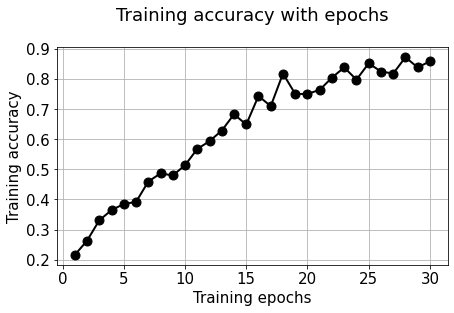

In [19]:
plt.figure(figsize=(7,4))
plt.plot([i+1 for i in range(n_epochs)],history.history['acc'],'-o',c='k',lw=2,markersize=9)
plt.grid(True)
plt.title("Training accuracy with epochs\n",fontsize=18)
plt.xlabel("Training epochs",fontsize=15)
plt.ylabel("Training accuracy",fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show()

**Some ways to save the model...**

The saved model formats can be used to continue with the model preparation without actually starting from the beginning.<br>
The saved model files can be used to deploy the model in android or web applications.

In [21]:
model.save('my_model.h5')

In [16]:
model.save(filepath="save_model/")

In [ ]:
from tensorflow.keras.models import Sequential
model.export(export_dir='.')

In [17]:
converter = tf.lite.TFLiteConverter.from_saved_model('save_model')
tflite_model = converter.convert()
open("soil.tflite", "wb").write(tflite_model)

921292

In [ ]:
model.save_weights("model.h5")

In [ ]:
#  tf.keras.models.save_model(model, filepath="save_model/save_model")

In [22]:
model=load_model('my_model.h5')

NameError: name 'load_model' is not defined

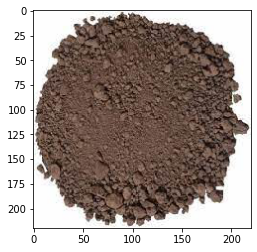

1/1 [==============================] - 0s 31ms/step
[[8.7542482e-02 1.2787353e-02 1.9421545e-03 8.9746952e-01 2.5852901e-04]]


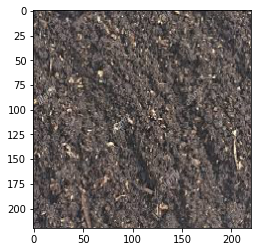

1/1 [==============================] - 0s 24ms/step
[[9.3573231e-01 2.4556778e-02 2.8723027e-04 3.9263632e-02 1.6002422e-04]]


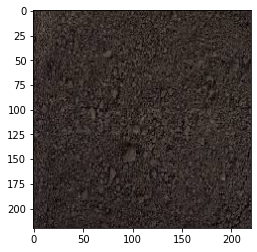

1/1 [==============================] - 0s 31ms/step
[[9.5347303e-01 7.7235801e-03 6.4086562e-05 3.8711768e-02 2.7478225e-05]]


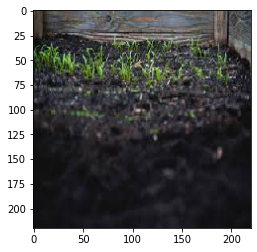

1/1 [==============================] - 0s 54ms/step
[[9.88505363e-01 1.46642420e-03 2.07984658e-06 1.00253625e-02
  7.26921144e-07]]


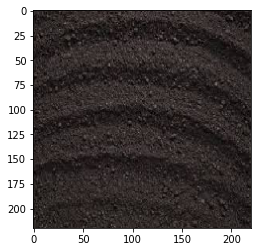

1/1 [==============================] - 0s 29ms/step
[[9.8566562e-01 2.5135069e-03 5.3300937e-06 1.1813377e-02 2.1771909e-06]]


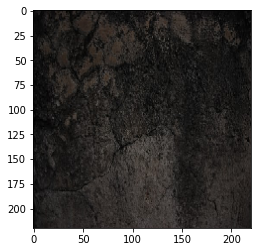

1/1 [==============================] - 0s 35ms/step
[[9.9779427e-01 3.0890081e-04 6.1124624e-08 1.8967727e-03 2.0429013e-08]]


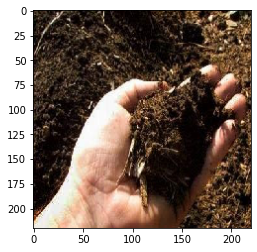

1/1 [==============================] - 0s 33ms/step
[[9.8553109e-01 4.8070514e-04 4.0524213e-07 1.3987637e-02 2.0989869e-07]]


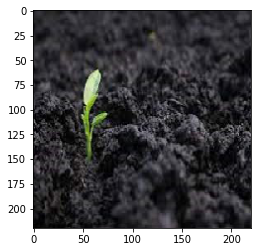

1/1 [==============================] - 0s 34ms/step
[[9.9764234e-01 4.0854362e-04 4.7340972e-08 1.9490675e-03 1.7430061e-08]]


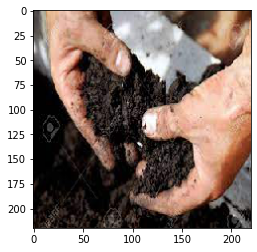

1/1 [==============================] - 0s 34ms/step
[[9.7801101e-01 9.4579053e-05 1.0397877e-07 2.1894271e-02 3.2779710e-08]]


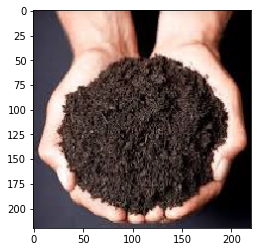

1/1 [==============================] - 0s 27ms/step
[[9.538247e-01 2.592664e-03 6.384184e-06 4.357427e-02 1.916364e-06]]


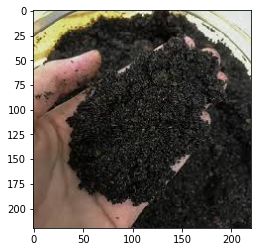

1/1 [==============================] - 0s 37ms/step
[[9.9883896e-01 9.5138232e-05 5.6552860e-09 1.0658762e-03 1.8725252e-09]]


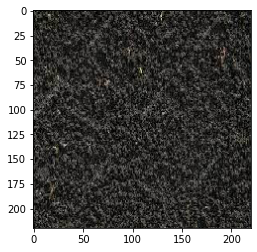

1/1 [==============================] - 0s 31ms/step
[[9.9668616e-01 1.2605475e-03 2.5832190e-07 2.0529116e-03 1.0746720e-07]]


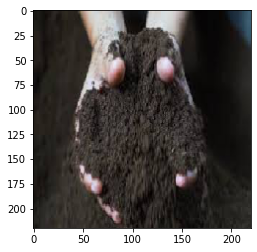

1/1 [==============================] - 0s 51ms/step
[[9.7761792e-01 1.5609830e-03 3.2113539e-06 2.0816777e-02 1.0149971e-06]]


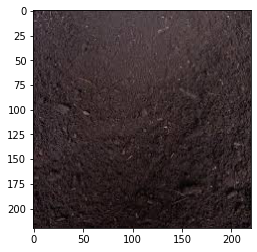

1/1 [==============================] - 0s 32ms/step
[[8.0982816e-01 5.9912745e-03 8.9208108e-05 1.8407129e-01 2.0053025e-05]]


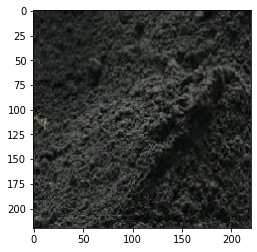

1/1 [==============================] - 0s 33ms/step
[[9.9668175e-01 9.6262351e-04 2.7042910e-07 2.3552317e-03 9.6161450e-08]]


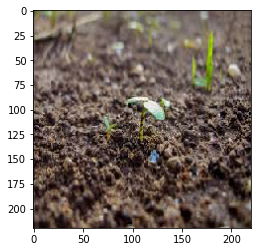

1/1 [==============================] - 0s 28ms/step
[[4.4873458e-01 1.9407466e-02 6.5311021e-04 5.3107494e-01 1.2989411e-04]]


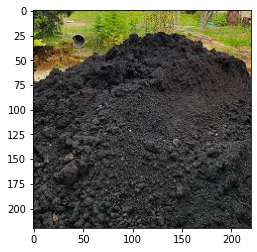

1/1 [==============================] - 0s 32ms/step
[[9.9808574e-01 6.9704064e-04 2.6432110e-07 1.2169456e-03 1.2604097e-07]]


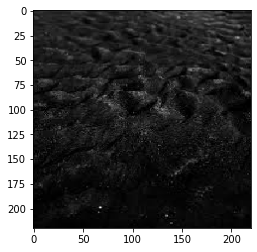

1/1 [==============================] - 0s 40ms/step
[[9.9960607e-01 1.6876897e-05 2.7347452e-10 3.7710005e-04 5.2854107e-11]]


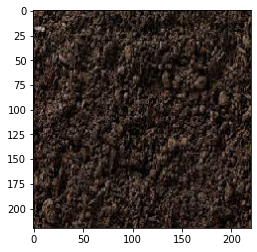

1/1 [==============================] - 0s 44ms/step
[[9.9548018e-01 2.7211913e-04 7.7846522e-08 4.2475131e-03 2.1982469e-08]]


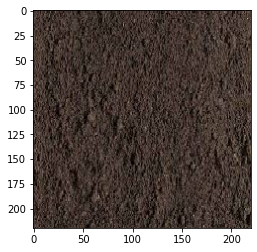

1/1 [==============================] - 0s 32ms/step
[[9.2345196e-01 8.3291456e-03 9.1341426e-05 6.8093821e-02 3.3654876e-05]]


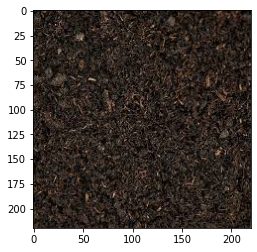

1/1 [==============================] - 0s 70ms/step
[[9.9192119e-01 1.3430018e-03 1.1737874e-06 6.7342971e-03 4.0714684e-07]]


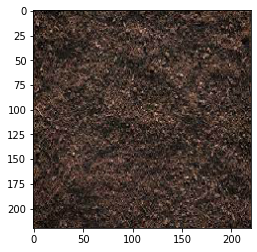

1/1 [==============================] - 0s 32ms/step
[[9.4468296e-01 7.7376198e-03 6.4559848e-05 4.7489207e-02 2.5720157e-05]]


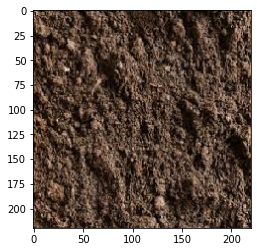

1/1 [==============================] - 0s 32ms/step
[[5.2581072e-01 7.4521145e-03 1.5551690e-04 4.6655607e-01 2.5620833e-05]]


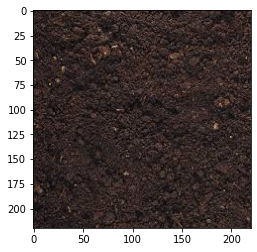

1/1 [==============================] - 0s 52ms/step
[[9.5569313e-01 4.2821201e-03 2.5372610e-05 3.9990384e-02 8.9564528e-06]]


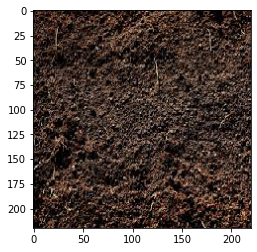

1/1 [==============================] - 0s 43ms/step
[[9.9664873e-01 8.3617575e-04 2.2404552e-07 2.5147225e-03 8.3122700e-08]]


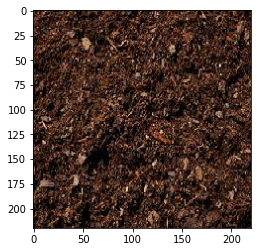

1/1 [==============================] - 0s 29ms/step
[[8.0908912e-01 2.0318860e-03 1.0869302e-05 1.8886620e-01 1.7875036e-06]]


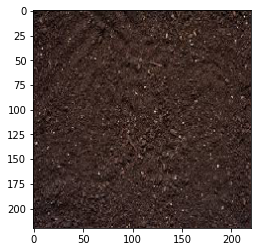

1/1 [==============================] - 0s 24ms/step
[[6.0991096e-01 9.0562971e-03 2.1906293e-04 3.8077036e-01 4.3353470e-05]]


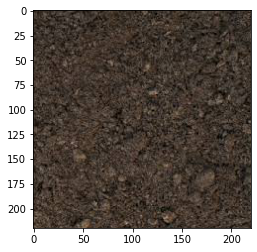

1/1 [==============================] - 0s 51ms/step
[[7.0873064e-01 1.1253332e-02 2.7623182e-04 2.7966884e-01 7.0973569e-05]]


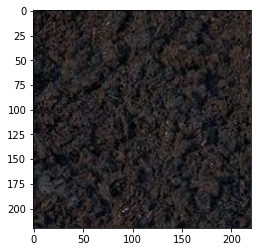

1/1 [==============================] - 0s 32ms/step
[[9.9794775e-01 3.6175238e-04 5.4762154e-08 1.6904781e-03 1.7894132e-08]]


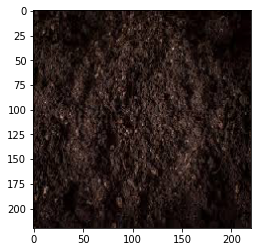

1/1 [==============================] - 0s 20ms/step
[[9.7524071e-01 3.7372301e-04 3.5969322e-07 2.4385145e-02 7.7818264e-08]]


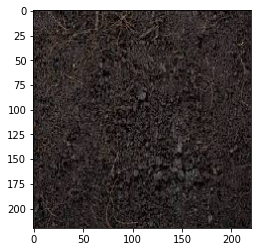

1/1 [==============================] - 0s 49ms/step
[[9.8903233e-01 2.5806639e-03 3.0816238e-06 8.3827525e-03 1.2243739e-06]]


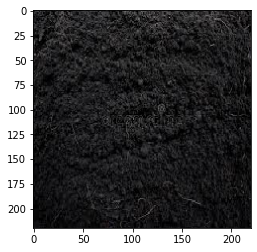

1/1 [==============================] - 0s 32ms/step
[[9.9961984e-01 5.5004810e-05 8.6888174e-10 3.2508426e-04 2.1945905e-10]]


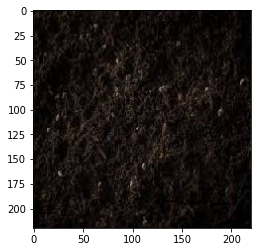

1/1 [==============================] - 0s 40ms/step
[[9.9857306e-01 1.5826592e-05 4.8412396e-10 1.4110670e-03 8.7139185e-11]]


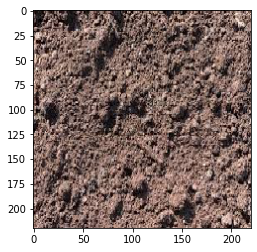

1/1 [==============================] - 0s 25ms/step
[[6.7729795e-01 3.1468980e-02 1.1570362e-03 2.8970486e-01 3.7120527e-04]]


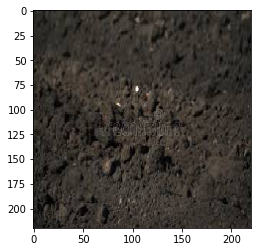

1/1 [==============================] - 0s 32ms/step
[[9.6578383e-01 3.4038995e-03 1.1997997e-05 3.0796265e-02 3.9904116e-06]]


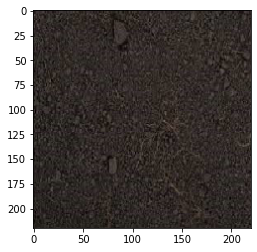

1/1 [==============================] - 0s 33ms/step
[[9.4154197e-01 7.6604183e-03 7.5234544e-05 5.0692622e-02 2.9773875e-05]]


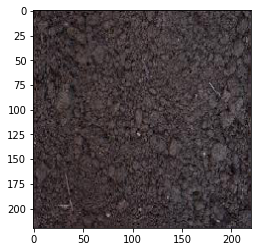

1/1 [==============================] - 0s 32ms/step
[[9.5673853e-01 1.2303988e-02 1.0245362e-04 3.0802844e-02 5.2242820e-05]]


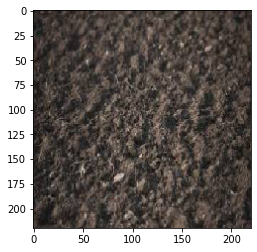

1/1 [==============================] - 0s 41ms/step
[[9.3525398e-01 1.4034824e-02 1.4751010e-04 5.0502893e-02 6.0734634e-05]]


In [38]:
import os
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt
import numpy as np

# Define the target size for the images
target_size = (220, 220)  # Adjust this size as needed

# Define the rescaling factor
rescale_factor = 1.0 / 255.0  # Normalize pixel values to the range [0, 1]

test_dir = r'C:\Users\Al Amin\Downloads\Soil-Dataset\Black Soil'

for i in os.listdir(test_dir):
    # Load the image and apply rescaling
    img = image.load_img(os.path.join(test_dir, i), target_size=target_size)
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x *= rescale_factor  # Apply rescaling
    images = np.vstack([x])

    # Display the image
    plt.imshow(img)
    plt.show()

    # Perform prediction with your model (replace 'model' with your actual model)
    val = model.predict(images)
    print(val)


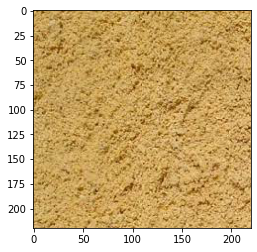

1/1 [==============================] - 0s 28ms/step
Predicted Soil: Yellow Soil


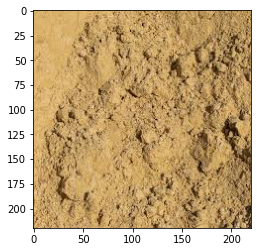

1/1 [==============================] - 0s 34ms/step
Predicted Soil: Yellow Soil


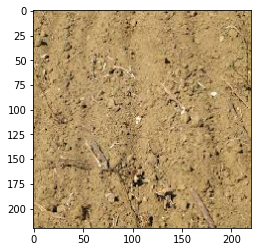

1/1 [==============================] - 0s 29ms/step
Predicted Soil: Yellow Soil


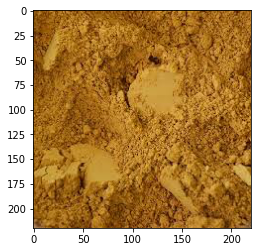

1/1 [==============================] - 0s 48ms/step
Predicted Soil: Yellow Soil


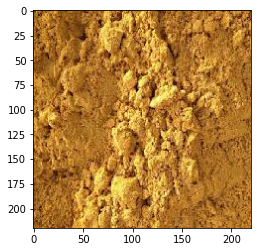

1/1 [==============================] - 0s 27ms/step
Predicted Soil: Yellow Soil


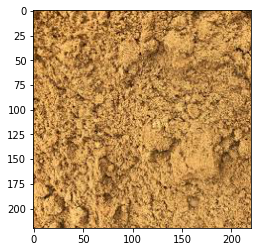

1/1 [==============================] - 0s 29ms/step
Predicted Soil: Yellow Soil


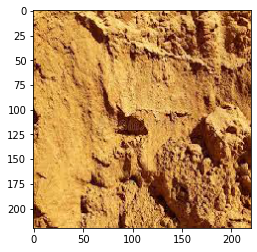

1/1 [==============================] - 0s 34ms/step
Predicted Soil: Yellow Soil


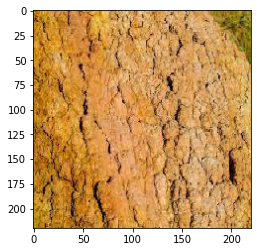

1/1 [==============================] - 0s 30ms/step
Predicted Soil: Yellow Soil


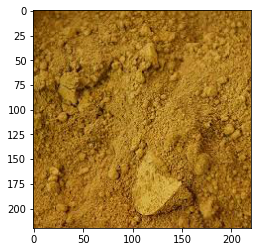

1/1 [==============================] - 0s 34ms/step
Predicted Soil: Yellow Soil


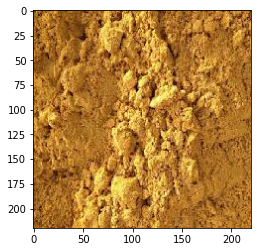

1/1 [==============================] - 0s 33ms/step
Predicted Soil: Yellow Soil


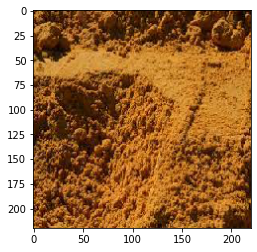

1/1 [==============================] - 0s 28ms/step
Predicted Soil: Yellow Soil


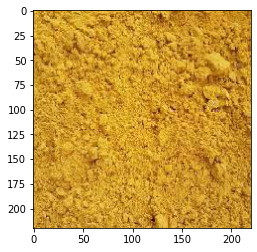

1/1 [==============================] - 0s 31ms/step
Predicted Soil: Yellow Soil


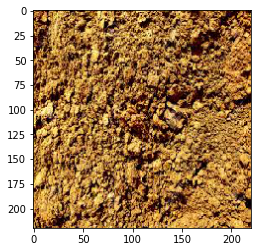

1/1 [==============================] - 0s 29ms/step
Predicted Soil: Yellow Soil


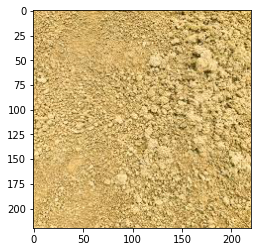

1/1 [==============================] - 0s 36ms/step
Predicted Soil: Yellow Soil


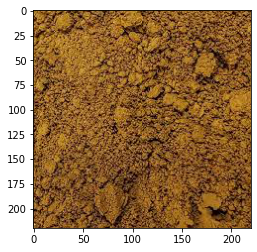

1/1 [==============================] - 0s 41ms/step
Predicted Soil: Yellow Soil


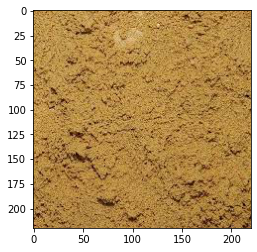

1/1 [==============================] - 0s 44ms/step
Predicted Soil: Yellow Soil


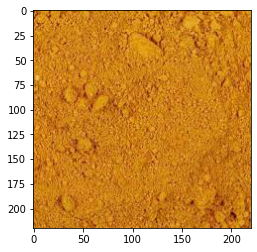

1/1 [==============================] - 0s 24ms/step
Predicted Soil: Yellow Soil


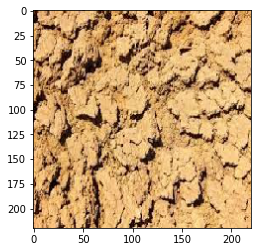

1/1 [==============================] - 0s 30ms/step
Predicted Soil: Yellow Soil


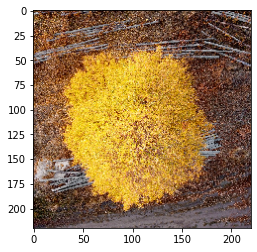

1/1 [==============================] - 0s 72ms/step
Predicted Soil: Yellow Soil


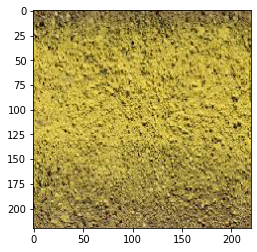

1/1 [==============================] - 0s 31ms/step
Predicted Soil: Yellow Soil


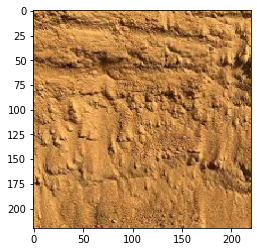

1/1 [==============================] - 0s 63ms/step
Predicted Soil: Yellow Soil


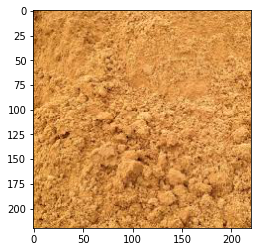

1/1 [==============================] - 0s 25ms/step
Predicted Soil: Yellow Soil


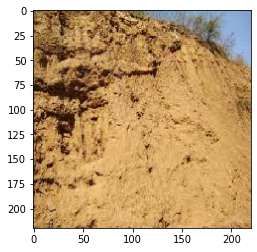

1/1 [==============================] - 0s 31ms/step
Predicted Soil: Yellow Soil


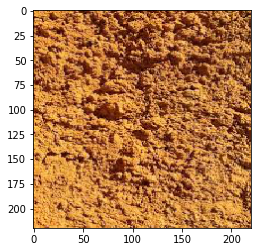

1/1 [==============================] - 0s 30ms/step
Predicted Soil: Yellow Soil


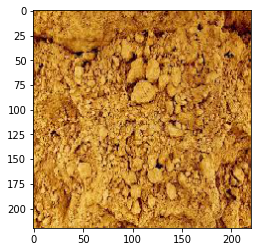

1/1 [==============================] - 0s 33ms/step
Predicted Soil: Yellow Soil


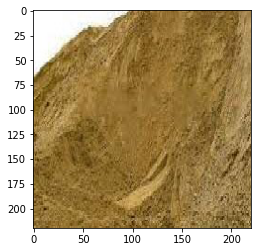

1/1 [==============================] - 0s 36ms/step
Predicted Soil: Yellow Soil


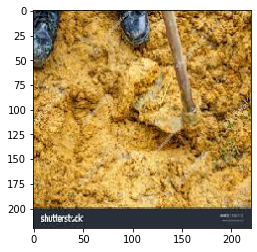

1/1 [==============================] - 0s 29ms/step
Predicted Soil: Yellow Soil


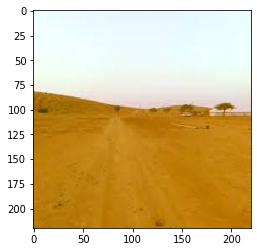

1/1 [==============================] - 0s 53ms/step
Predicted Soil: Yellow Soil


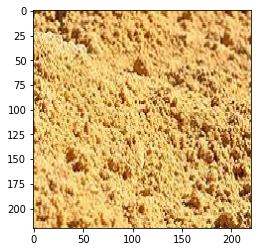

1/1 [==============================] - 0s 68ms/step
Predicted Soil: Yellow Soil


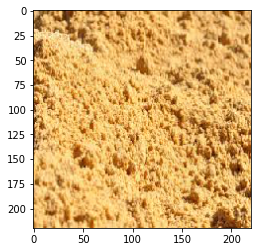

1/1 [==============================] - 0s 62ms/step
Predicted Soil: Yellow Soil


In [43]:
import os
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt
import numpy as np

# Define the target size for the images
target_size = (220, 220)  # Adjust this size as needed

# Define the rescaling factor
rescale_factor = 1.0 / 255.0  # Normalize pixel values to the range [0, 1]

# Define a dictionary to map class indices to soil names
soil_names = {
    0: 'Black Soil',
    1: 'Cinder Soil',
    2: 'Laterite Soil',
    3: 'Peat Soil',
    4: 'Yellow Soil'
}

test_dir = r'C:\Users\Al Amin\Downloads\Soil-Dataset\Yellow Soil'

for i in os.listdir(test_dir):
    # Load the image and apply rescaling
    img = image.load_img(os.path.join(test_dir, i), target_size=target_size)
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x *= rescale_factor  # Apply rescaling
    images = np.vstack([x])

    # Display the image
    plt.imshow(img)
    plt.show()

    # Perform prediction with your model (replace 'model' with your actual model)
    predictions = model.predict(images)
    
    # Get the predicted class index
    predicted_class_index = np.argmax(predictions, axis=1)[0]
    
    # Look up the soil name using the dictionary
    predicted_soil_name = soil_names.get(predicted_class_index, 'Unknown Soil')
    
    print("Predicted Soil:", predicted_soil_name)


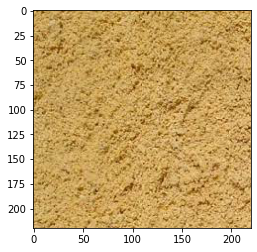

1/1 [==============================] - 0s 35ms/step
Predicted Soil: Yellow Soil
Recommended Crops for Yellow Soil
- Maize (Corn)
- Rice
- Oilseeds
- Groundnuts (Peanuts)
- Sorghum


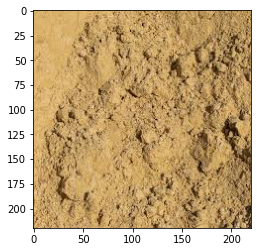

1/1 [==============================] - 0s 34ms/step
Predicted Soil: Yellow Soil
Recommended Crops for Yellow Soil
- Maize (Corn)
- Rice
- Oilseeds
- Groundnuts (Peanuts)
- Sorghum


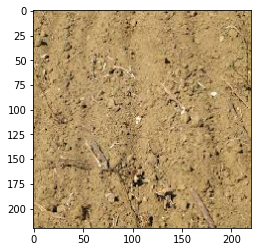

1/1 [==============================] - 0s 41ms/step
Predicted Soil: Yellow Soil
Recommended Crops for Yellow Soil
- Maize (Corn)
- Rice
- Oilseeds
- Groundnuts (Peanuts)
- Sorghum


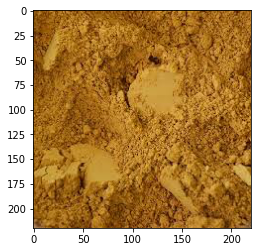

1/1 [==============================] - 0s 24ms/step
Predicted Soil: Yellow Soil
Recommended Crops for Yellow Soil
- Maize (Corn)
- Rice
- Oilseeds
- Groundnuts (Peanuts)
- Sorghum


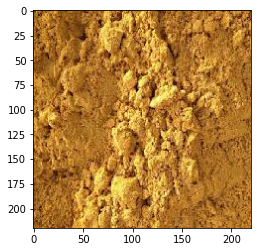

1/1 [==============================] - 0s 33ms/step
Predicted Soil: Yellow Soil
Recommended Crops for Yellow Soil
- Maize (Corn)
- Rice
- Oilseeds
- Groundnuts (Peanuts)
- Sorghum


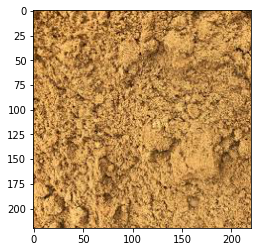

1/1 [==============================] - 0s 51ms/step
Predicted Soil: Yellow Soil
Recommended Crops for Yellow Soil
- Maize (Corn)
- Rice
- Oilseeds
- Groundnuts (Peanuts)
- Sorghum


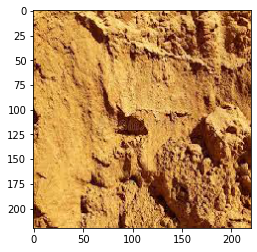

1/1 [==============================] - 0s 29ms/step
Predicted Soil: Yellow Soil
Recommended Crops for Yellow Soil
- Maize (Corn)
- Rice
- Oilseeds
- Groundnuts (Peanuts)
- Sorghum


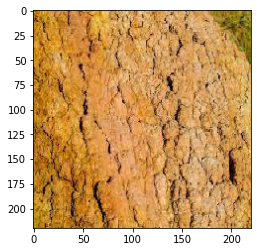

1/1 [==============================] - 0s 33ms/step
Predicted Soil: Yellow Soil
Recommended Crops for Yellow Soil
- Maize (Corn)
- Rice
- Oilseeds
- Groundnuts (Peanuts)
- Sorghum


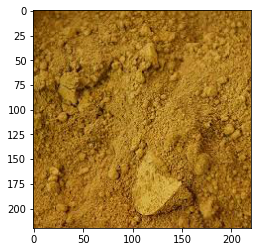

1/1 [==============================] - 0s 34ms/step
Predicted Soil: Yellow Soil
Recommended Crops for Yellow Soil
- Maize (Corn)
- Rice
- Oilseeds
- Groundnuts (Peanuts)
- Sorghum


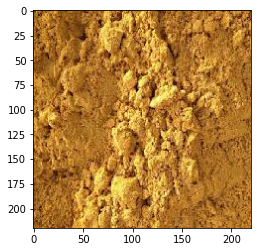

1/1 [==============================] - 0s 37ms/step
Predicted Soil: Yellow Soil
Recommended Crops for Yellow Soil
- Maize (Corn)
- Rice
- Oilseeds
- Groundnuts (Peanuts)
- Sorghum


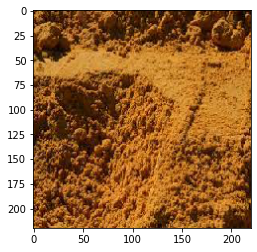

1/1 [==============================] - 0s 37ms/step
Predicted Soil: Yellow Soil
Recommended Crops for Yellow Soil
- Maize (Corn)
- Rice
- Oilseeds
- Groundnuts (Peanuts)
- Sorghum


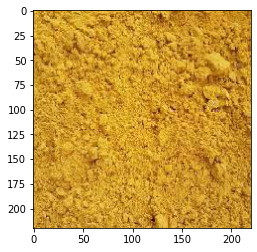

1/1 [==============================] - 0s 29ms/step
Predicted Soil: Yellow Soil
Recommended Crops for Yellow Soil
- Maize (Corn)
- Rice
- Oilseeds
- Groundnuts (Peanuts)
- Sorghum


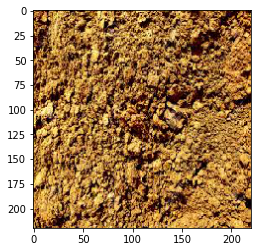

1/1 [==============================] - 0s 28ms/step
Predicted Soil: Yellow Soil
Recommended Crops for Yellow Soil
- Maize (Corn)
- Rice
- Oilseeds
- Groundnuts (Peanuts)
- Sorghum


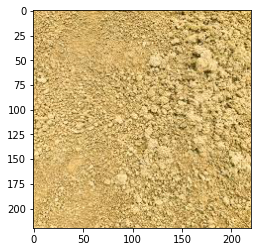

1/1 [==============================] - 0s 29ms/step
Predicted Soil: Yellow Soil
Recommended Crops for Yellow Soil
- Maize (Corn)
- Rice
- Oilseeds
- Groundnuts (Peanuts)
- Sorghum


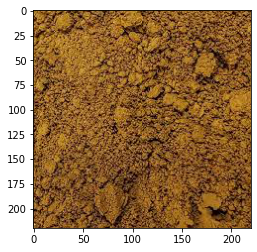

1/1 [==============================] - 0s 28ms/step
Predicted Soil: Yellow Soil
Recommended Crops for Yellow Soil
- Maize (Corn)
- Rice
- Oilseeds
- Groundnuts (Peanuts)
- Sorghum


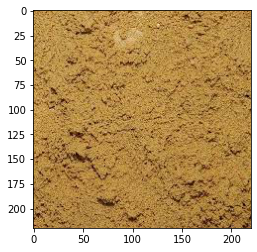

1/1 [==============================] - 0s 32ms/step
Predicted Soil: Yellow Soil
Recommended Crops for Yellow Soil
- Maize (Corn)
- Rice
- Oilseeds
- Groundnuts (Peanuts)
- Sorghum


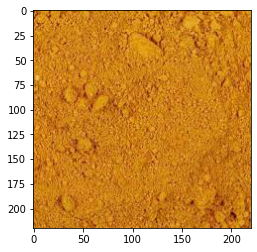

1/1 [==============================] - 0s 37ms/step
Predicted Soil: Yellow Soil
Recommended Crops for Yellow Soil
- Maize (Corn)
- Rice
- Oilseeds
- Groundnuts (Peanuts)
- Sorghum


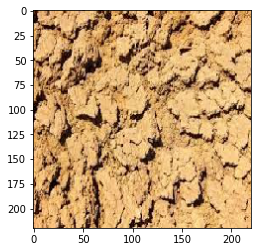

1/1 [==============================] - 0s 37ms/step
Predicted Soil: Yellow Soil
Recommended Crops for Yellow Soil
- Maize (Corn)
- Rice
- Oilseeds
- Groundnuts (Peanuts)
- Sorghum


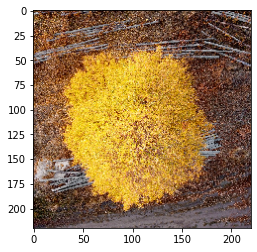

1/1 [==============================] - 0s 35ms/step
Predicted Soil: Yellow Soil
Recommended Crops for Yellow Soil
- Maize (Corn)
- Rice
- Oilseeds
- Groundnuts (Peanuts)
- Sorghum


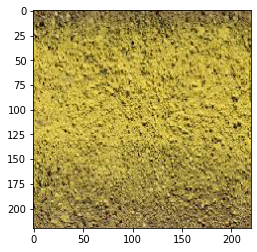

1/1 [==============================] - 0s 62ms/step
Predicted Soil: Yellow Soil
Recommended Crops for Yellow Soil
- Maize (Corn)
- Rice
- Oilseeds
- Groundnuts (Peanuts)
- Sorghum


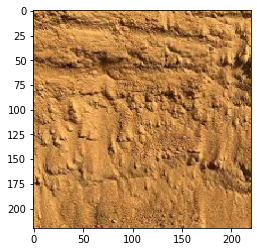

1/1 [==============================] - 0s 37ms/step
Predicted Soil: Yellow Soil
Recommended Crops for Yellow Soil
- Maize (Corn)
- Rice
- Oilseeds
- Groundnuts (Peanuts)
- Sorghum


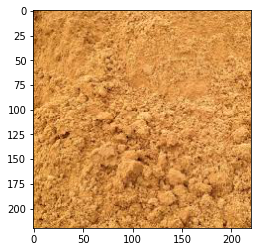

1/1 [==============================] - 0s 30ms/step
Predicted Soil: Yellow Soil
Recommended Crops for Yellow Soil
- Maize (Corn)
- Rice
- Oilseeds
- Groundnuts (Peanuts)
- Sorghum


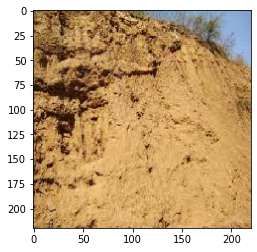

1/1 [==============================] - 0s 31ms/step
Predicted Soil: Yellow Soil
Recommended Crops for Yellow Soil
- Maize (Corn)
- Rice
- Oilseeds
- Groundnuts (Peanuts)
- Sorghum


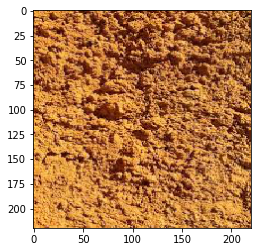

1/1 [==============================] - 0s 33ms/step
Predicted Soil: Yellow Soil
Recommended Crops for Yellow Soil
- Maize (Corn)
- Rice
- Oilseeds
- Groundnuts (Peanuts)
- Sorghum


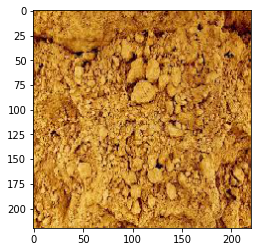

1/1 [==============================] - 0s 41ms/step
Predicted Soil: Yellow Soil
Recommended Crops for Yellow Soil
- Maize (Corn)
- Rice
- Oilseeds
- Groundnuts (Peanuts)
- Sorghum


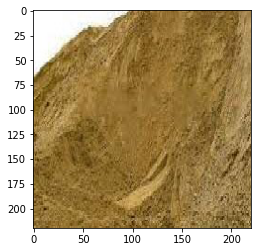

1/1 [==============================] - 0s 25ms/step
Predicted Soil: Yellow Soil
Recommended Crops for Yellow Soil
- Maize (Corn)
- Rice
- Oilseeds
- Groundnuts (Peanuts)
- Sorghum


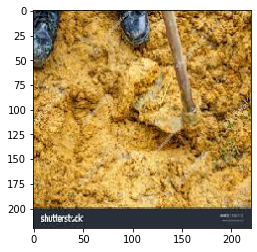

1/1 [==============================] - 0s 35ms/step
Predicted Soil: Yellow Soil
Recommended Crops for Yellow Soil
- Maize (Corn)
- Rice
- Oilseeds
- Groundnuts (Peanuts)
- Sorghum


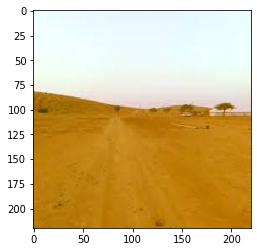

1/1 [==============================] - 0s 33ms/step
Predicted Soil: Yellow Soil
Recommended Crops for Yellow Soil
- Maize (Corn)
- Rice
- Oilseeds
- Groundnuts (Peanuts)
- Sorghum


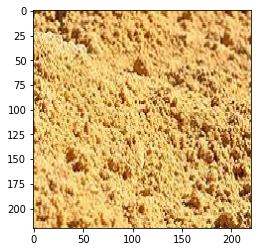

1/1 [==============================] - 0s 61ms/step
Predicted Soil: Yellow Soil
Recommended Crops for Yellow Soil
- Maize (Corn)
- Rice
- Oilseeds
- Groundnuts (Peanuts)
- Sorghum


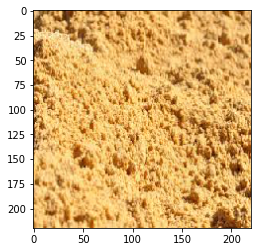

1/1 [==============================] - 0s 31ms/step
Predicted Soil: Yellow Soil
Recommended Crops for Yellow Soil
- Maize (Corn)
- Rice
- Oilseeds
- Groundnuts (Peanuts)
- Sorghum


In [44]:
import os
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt
import numpy as np

# Define the target size for the images
target_size = (220, 220)  # Adjust this size as needed

# Define the rescaling factor
rescale_factor = 1.0 / 255.0  # Normalize pixel values to the range [0, 1]

# Define a dictionary to map class indices to soil names
soil_names = {
    0: 'Black Soil',
    1: 'Cinder Soil',
    2: 'Laterite Soil',
    3: 'Peat Soil',
    4: 'Yellow Soil'
}

# Define a dictionary of crop suitability for different soil types
crop_suitability = {
    'Black Soil': ['Cotton', 'Soybeans', 'Chickpeas', 'Sorghum', 'Pearl Millet'],
    'Cinder Soil': ['Coffee', 'Tea', 'Pineapples', 'Bananas', 'Avocado'],
    'Laterite Soil': ['Cashew', 'Tapioca (Cassava)', 'Rubber', 'Oil Palm', 'Cocoa'],
    'Peat Soil': ['Cranberries', 'Reeds', 'Sphagnum Moss', 'Willow Trees', 'Certain Vegetables'],
    'Yellow Soil': ['Maize (Corn)', 'Rice', 'Oilseeds', 'Groundnuts (Peanuts)', 'Sorghum']
}

test_dir = r'C:\Users\Al Amin\Downloads\Soil-Dataset\Yellow Soil'

for i in os.listdir(test_dir):
    # Load the image and apply rescaling
    img = image.load_img(os.path.join(test_dir, i), target_size=target_size)
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x *= rescale_factor  # Apply rescaling
    images = np.vstack([x])

    # Display the image
    plt.imshow(img)
    plt.show()

    # Perform prediction with your model (replace 'model' with your actual model)
    predictions = model.predict(images)

    # Get the predicted class index
    predicted_class_index = np.argmax(predictions, axis=1)[0]

    # Look up the soil name using the dictionary
    predicted_soil_name = soil_names.get(predicted_class_index, 'Unknown Soil')

    # Print the predicted soil
    print("Predicted Soil:", predicted_soil_name)

    # Recommend crops based on the predicted soil
    recommended_crops = crop_suitability.get(predicted_soil_name, 'No specific recommendations available for this soil type.')
    print("Recommended Crops for", predicted_soil_name)
    for crop in recommended_crops:
        print("- " + crop)
